### Visualisation Regularization - Feature Visualization

In [2]:
import sys
sys.path.append(r"../")
%matplotlib inline
from luna.pretrained_models import models
from luna.featurevis import featurevis, images
import matplotlib.pyplot as plt
import tensorflow as tf

In [3]:
# Initialization
image_size = 349
model_name = "inceptionV3"
layer_name = "mixed5"
channel_num =30

# optimizer params
iterations = 65
learning_rate = 0.05

#Threshold
thresholds=[1, 32, 64]


# model
model = models.model_inceptionv3()

## Beautiful Luna



initializing image
Starting Feature Vis Process
Deprocessing image
Deprocessing image
Deprocessing image
Deprocessing image
Deprocessing image
>> 100 %
Deprocessing image


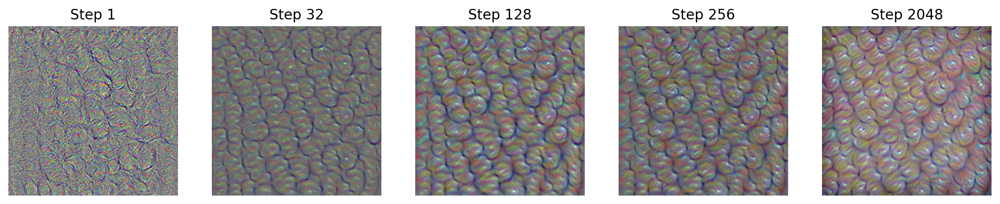

In [5]:
iteration_luna = 2050
learning_rate_luna = 0.65
image = images.initialize_image(image_size, image_size)
aux_aug_param = featurevis.AuxiliaryTransformationParameters(add_blur=True, scale=True)
opt_param = featurevis.OptimizationParameters(iteration_luna, learning_rate_luna, optimizer=None)
_, image = featurevis.visualize_filter(image, model, layer_name, channel_num, opt_param,
                                        aux_trans_param=aux_aug_param,
                                        threshold=[1, 32, 128, 256, 2048])

## Naive Feature Visualisation
one to one same as Lucid

initializing image
Starting Feature Vis Process
Deprocessing image
Deprocessing image
Deprocessing image
>> 100 %
Deprocessing image


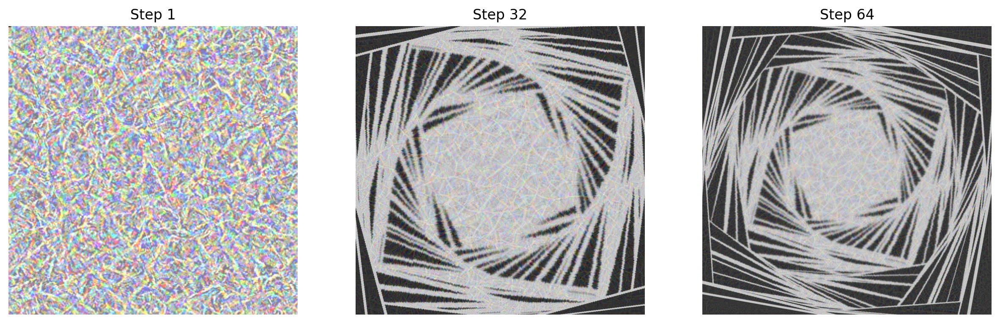

In [3]:
image = images.initialize_image_ref(image_size,image_size, fft=False, decorrelate=False)
optimizer = tf.keras.optimizers.Adam()
opt_param = featurevis.OptimizationParameters(iterations, learning_rate, optimizer=optimizer)
_ , _= featurevis.visualize_filter(image, model, layer_name, channel_num,
                                       opt_param, threshold=thresholds)


## Frequency Penalization

Starting Feature Vis Process
Deprocessing image
Deprocessing image
Deprocessing image
>> 100 %
Deprocessing image


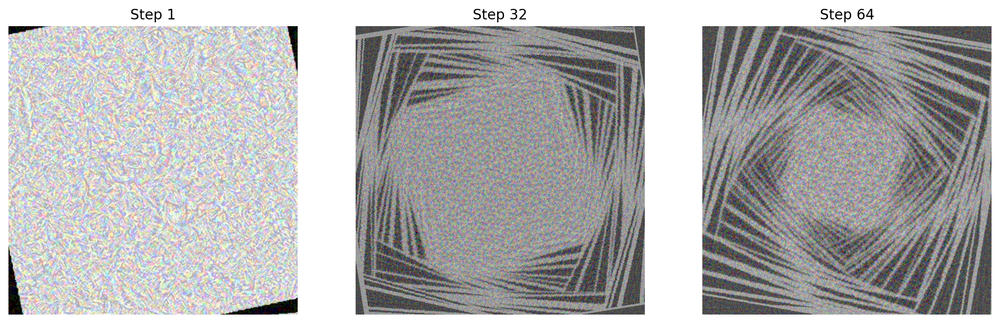

In [5]:
reg = {"l1_regularizer":-0.05, "tv_regularizer": -0.25, "blur_regularizer": -1.0}

_ , _= featurevis.visualize_filter(image, model, layer_name, channel_num,
                                       opt_param, regularizers=reg, threshold=thresholds)



## Transformation Robustness

initializing image
Starting Feature Vis Process
Deprocessing image
Deprocessing image
Deprocessing image
Deprocessing image
Deprocessing image
>> 100 %
Deprocessing image


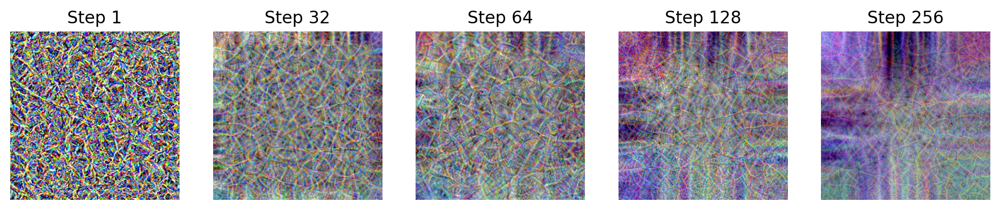

In [7]:
image = images.initialize_image_ref(image_size,image_size, fft=False, decorrelate=False)
optimizer = tf.keras.optimizers.Adam()
iteration_trans = 257
rescale = [1.1 ** (n/10.) for n in range(-10, 11)]
opt_param = featurevis.OptimizationParameters(iteration_trans, learning_rate, optimizer=optimizer)
custom = {"pad": [2, "REFLECT"], "jitter": 1,
          "bilinear_rescale": rescale ,
          }#"rotation": [i for i in range(-5, 6)]

_ , _= featurevis.visualize_filter(image, model, layer_name, channel_num,
                                       opt_param, custom_trans=custom,
                                       threshold=[1,32,64,128,256,512])

## Preconditioning

initializing image
Starting Feature Vis Process
Deprocessing image
Deprocessing image
Deprocessing image
>> 100 %
Deprocessing image


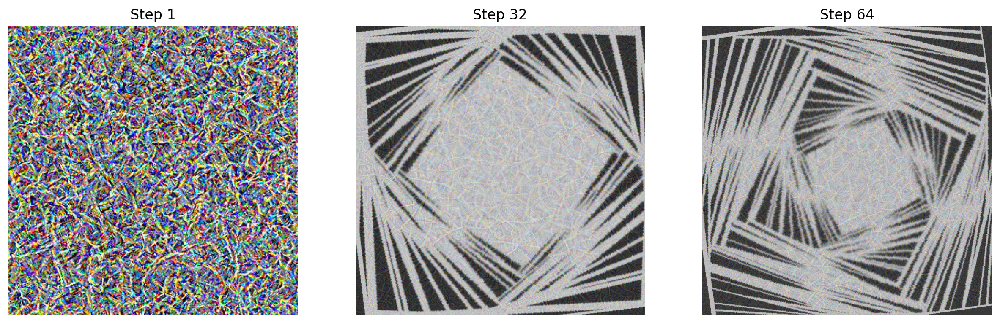

In [6]:
iteration_precon = 65
image = images.initialize_image_ref(image_size,image_size, fft=True, decorrelate=True)
optimizer = tf.keras.optimizers.Adam()
opt_param = featurevis.OptimizationParameters(iteration_precon, learning_rate, optimizer=optimizer)
_ , _= featurevis.visualize_filter(image, model, layer_name, channel_num,
                                       opt_param,
                                       threshold=[1,32,64])